In [1]:
!pip install ultralytics roboflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 25.2 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.4/85.4 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 35.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 103.9 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.0 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.2 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.1 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
import os
import glob
import yaml
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
from ultralytics import YOLO
from roboflow import Roboflow
from IPython.display import Image as IPyImage, display
from tqdm.notebook import tqdm

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
rf = Roboflow(api_key="MahjDUUCeLFOeyYOVPrc")
project = rf.workspace("haeun-kim-ri91b").project("license-plate-detection-wienp")
version = project.version(2)
dataset = version.download("yolov11")

print(f"Dataset Location: {dataset.location}")
print(f"Dataset Name: {dataset.name}")
print(f"Dataset Version: {dataset.version}")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to license-plate-detection-2 in yolov11:: 100%|██████████| 11144/11144 [00:01<00:00, 6414.80it/s]


Dataset Location: /kaggle/working/license-plate-detection-2
Dataset Name: license plate detection
Dataset Version: 2


In [4]:
with open(f"{dataset.location}/data.yaml", 'r') as f:
    data_config = yaml.safe_load(f)

print("\nDataset Configuration:")
for key, value in data_config.items():
    print(f"  {key}: {value}")


Dataset Configuration:
  train: ../train/images
  val: ../valid/images
  test: ../test/images
  nc: 1
  names: ['LicensePlate']
  roboflow: {'workspace': 'haeun-kim-ri91b', 'project': 'license-plate-detection-wienp', 'version': 2, 'license': 'CC BY 4.0', 'url': 'https://universe.roboflow.com/haeun-kim-ri91b/license-plate-detection-wienp/dataset/2'}


In [5]:
train_labels_dir = f"{dataset.location}/train/labels"
val_labels_dir = f"{dataset.location}/valid/labels"
test_labels_dir = f"{dataset.location}/test/labels"

In [6]:
def count_labels(labels_dir, class_names):
    class_counts = {cls: 0 for cls in class_names}
    for label_file in glob.glob(f"{labels_dir}/*.txt"):
        with open(label_file, 'r') as f:
            for line in f:
                class_id = int(line.strip().split()[0])
                class_name = class_names[class_id]
                class_counts[class_name] += 1
    return class_counts

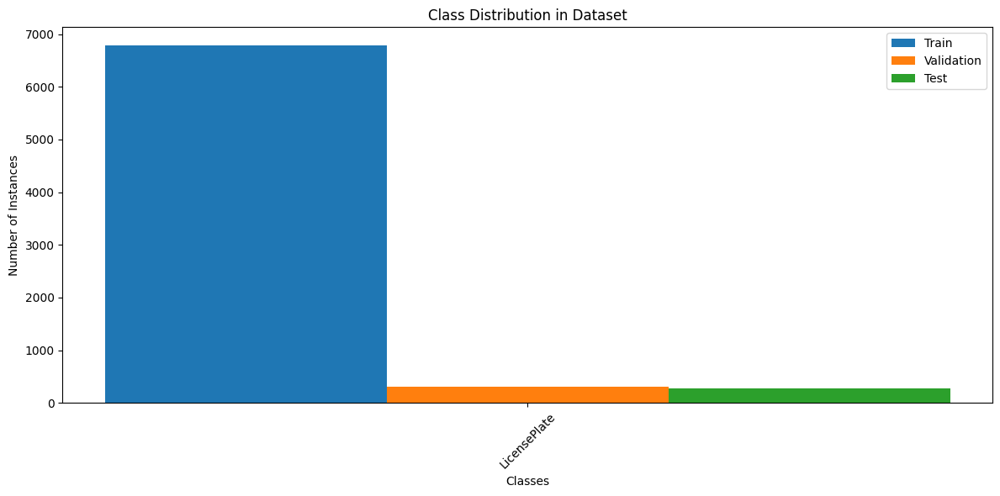

In [7]:
train_dist = count_labels(train_labels_dir, data_config['names'])
val_dist = count_labels(val_labels_dir, data_config['names'])
test_dist = count_labels(test_labels_dir, data_config['names'])

plt.figure(figsize=(12, 6))
x = np.arange(len(data_config['names']))
width = 0.25

plt.bar(x - width, [train_dist[cls] for cls in data_config['names']], width, label='Train')
plt.bar(x, [val_dist[cls] for cls in data_config['names']], width, label='Validation')
plt.bar(x + width, [test_dist[cls] for cls in data_config['names']], width, label='Test')

plt.xlabel('Classes')
plt.ylabel('Number of Instances')
plt.title('Class Distribution in Dataset')
plt.xticks(x, data_config['names'], rotation=45)
plt.legend()
plt.tight_layout()
plt.savefig('class_distribution.png')
plt.show()

In [8]:
def visualize_sample_images(dataset_path, data_config, num_samples=3):
    images_dir = os.path.join(dataset_path, 'train/images')
    labels_dir = os.path.join(dataset_path, 'train/labels')
    
    image_files = glob.glob(f"{images_dir}/*.jpg")
    np.random.shuffle(image_files)
    
    class_names = data_config['names']
    
    for img_path in image_files[:num_samples]:
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        height, width = img.shape[:2]
        
        label_path = os.path.join(labels_dir, os.path.basename(img_path).replace('.jpg', '.txt'))
        
        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                boxes = []
                labels = []
                
                for line in f:
                    parts = line.strip().split()
                    class_id = int(parts[0])
                    x_center, y_center, w, h = map(float, parts[1:5])
                    
                    x1 = int((x_center - w/2) * width)
                    y1 = int((y_center - h/2) * height)
                    x2 = int((x_center + w/2) * width)
                    y2 = int((y_center + h/2) * height)
                    
                    boxes.append([x1, y1, x2, y2])
                    labels.append(class_id)
            
            # Create a copy of the image for drawing
            annotated_img = img.copy()
            
            # Draw boxes and labels manually
            for i, (box, label_id) in enumerate(zip(boxes, labels)):
                x1, y1, x2, y2 = box
                
                # Draw rectangle
                cv2.rectangle(annotated_img, (x1, y1), (x2, y2), (0, 255, 0), 2)
                
                # Create label text
                class_name = class_names[label_id]
                label_text = f"{class_name}"
                
                # Calculate text size
                text_size = cv2.getTextSize(label_text, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 1)[0]
                
                # Draw label background
                cv2.rectangle(
                    annotated_img, 
                    (x1, y1 - text_size[1] - 10), 
                    (x1 + text_size[0] + 10, y1), 
                    (0, 255, 0), 
                    -1
                )
                
                # Draw label text
                cv2.putText(
                    annotated_img, 
                    label_text, 
                    (x1 + 5, y1 - 5), 
                    cv2.FONT_HERSHEY_SIMPLEX, 
                    0.6, 
                    (0, 0, 0), 
                    1, 
                    cv2.LINE_AA
                )
            
            plt.figure(figsize=(10, 8))
            plt.imshow(annotated_img)
            plt.title(f"Sample Image: {os.path.basename(img_path)}")
            plt.axis('off')
            plt.savefig(f"sample_{os.path.basename(img_path)}")
            plt.show()
        else:
            print(f"No labels found for {img_path}")

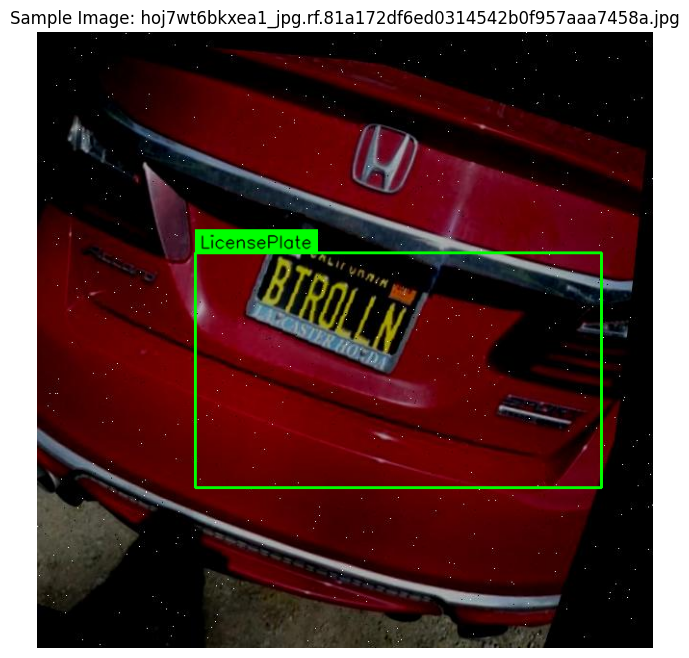

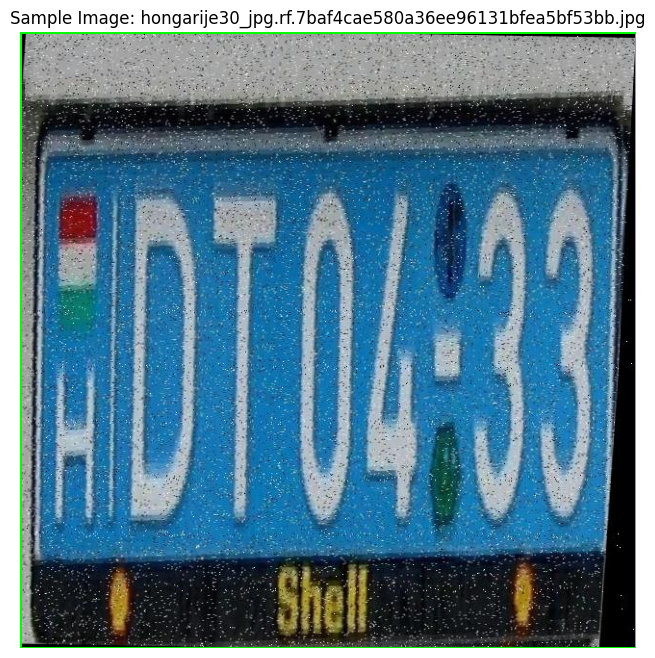

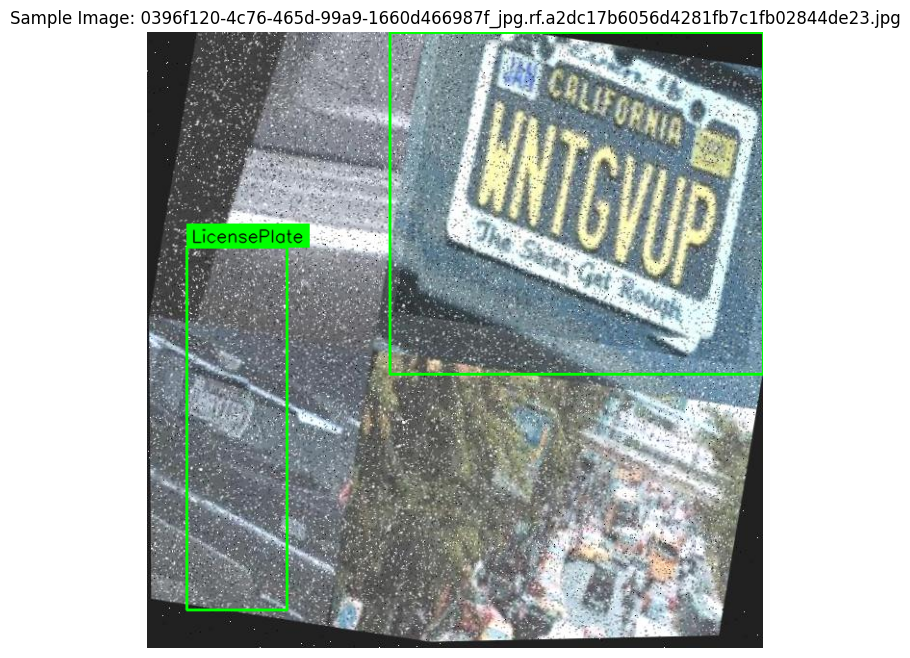

In [9]:
visualize_sample_images(dataset.location, data_config)

In [10]:
with open(f"{dataset.location}/data.yaml", 'r') as f:
    lines = f.readlines()

lines = lines[:-3]

lines.append(f"train: ../train/images\n")
lines.append(f"val: ../valid/images\n")
lines.append(f"test: ../test/images\n")

with open(f"{dataset.location}/data.yaml", 'w') as f:
    f.writelines(lines)

print("Updated data.yaml file with correct paths")

Updated data.yaml file with correct paths


In [11]:
base_dir = os.getcwd()

model_size = "s"  
model_name = f"yolo11{model_size}.pt"

epochs = 50
image_size = 640
batch_size = 32
patience = 20

train_args = {
    "data": f"{dataset.location}/data.yaml",
    "epochs": epochs,
    "imgsz": image_size,
    "batch": batch_size,
    "patience": patience,
    "device": 0 if torch.cuda.is_available() else "cpu",
    "workers": 4,
    "project": "yolov11_training",
    "name": f"setter_yolo11{model_size}",
    "exist_ok": True,
    "pretrained": True,
    "optimizer": "auto",
    "verbose": True,
    "seed": 42,
    "deterministic": True,
    "close_mosaic": 10,
    "plots": True,
    "save": True,
    "save_period": 10,
}

model = YOLO(model_name)

results = model.train(**train_args)

100%|██████████| 18.4M/18.4M [00:00<00:00, 227MB/s]


Ultralytics 8.3.140 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/license-plate-detection-2/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=setter_yolo11s, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=20, perspective

100%|██████████| 755k/755k [00:00<00:00, 26.1MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  3                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  4                  -1  1    103360  ultralytics.nn.modules.block.C3k2            [128, 256, 1, False, 0.25]    
  5                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  6                  -1  1    346112  ultralytics.nn.modules.block.C3k2            [256, 256, 1, True]           
  7                  -1  1   1180672  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 113MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1675.6±714.7 MB/s, size: 81.0 KB)


train: Scanning /kaggle/working/license-plate-detection-2/train/labels... 5115 images, 2 backgrounds, 0 corrupt: 100%|██████████| 5115/5115 [00:03<00:00, 1333.90it/s]


train: New cache created: /kaggle/working/license-plate-detection-2/train/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 3740, len(boxes) = 6793. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 370.6±99.3 MB/s, size: 90.4 KB)


val: Scanning /kaggle/working/license-plate-detection-2/valid/labels... 225 images, 0 backgrounds, 0 corrupt: 100%|██████████| 225/225 [00:00<00:00, 932.17it/s]

val: New cache created: /kaggle/working/license-plate-detection-2/valid/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 160, len(boxes) = 316. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to yolov11_training/setter_yolo11s/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to yolov11_training/setter_yolo11s
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      7.97G      1.293      1.472      1.503         60        640: 100%|██████████| 160/160 [01:37<00:00,  1.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:02<00:00,  1.36it/s]

                   all        225        316    0.00352      0.405    0.00219     0.0012



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      8.57G       1.38      1.246      1.568         65        640: 100%|██████████| 160/160 [01:35<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.25it/s]

                   all        225        316      0.511      0.484      0.473      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      8.57G      1.341      1.164      1.531         70        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.23it/s]

                   all        225        316      0.596      0.592      0.509      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50       8.6G      1.327      1.157      1.529         78        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.20it/s]

                   all        225        316      0.692      0.639      0.608      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      8.57G      1.262      1.018      1.461         59        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.17it/s]

                   all        225        316      0.746      0.623      0.662      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50       8.6G      1.216     0.9942      1.444         80        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.26it/s]

                   all        225        316      0.836      0.728      0.756      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      8.57G      1.188     0.9403      1.417         65        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.24it/s]

                   all        225        316      0.824      0.677      0.729       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      8.57G      1.158     0.9032      1.395         80        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.27it/s]

                   all        225        316      0.848      0.724      0.765      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      8.57G      1.132     0.8701      1.376         82        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.16it/s]

                   all        225        316      0.847      0.703      0.744      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      8.57G      1.134     0.8644      1.372         76        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.20it/s]

                   all        225        316      0.895      0.718      0.775      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      8.57G      1.106      0.852      1.363         56        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.26it/s]

                   all        225        316      0.904      0.712      0.765      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      8.57G      1.083     0.8125      1.341         60        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.24it/s]

                   all        225        316      0.856      0.741      0.774      0.524



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      8.57G      1.089     0.8164      1.341         77        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.32it/s]

                   all        225        316      0.804      0.752      0.778      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      8.62G      1.073     0.7931      1.331         79        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.30it/s]

                   all        225        316      0.831       0.75      0.781      0.539



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      8.57G      1.057     0.7785      1.321         62        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.24it/s]

                   all        225        316      0.825      0.761      0.789      0.518



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      8.57G      1.042     0.7635      1.302         59        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.29it/s]

                   all        225        316      0.873      0.763      0.806      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      8.57G      1.036     0.7577      1.301         59        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.30it/s]

                   all        225        316      0.832      0.791      0.801      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50       8.6G      1.027     0.7425      1.293         60        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.31it/s]

                   all        225        316      0.793      0.769      0.767      0.498



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      8.57G       1.01     0.7371      1.289         57        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.30it/s]

                   all        225        316       0.89      0.771      0.805      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50       8.6G      1.005     0.7288      1.272         62        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.29it/s]

                   all        225        316      0.858      0.791      0.822      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      8.57G      1.008     0.7371       1.28         77        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.31it/s]

                   all        225        316      0.867      0.782      0.821      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50       8.6G      1.004       0.73      1.273         65        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.33it/s]

                   all        225        316      0.916      0.757      0.811      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      8.57G     0.9927     0.7185      1.272         77        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.29it/s]

                   all        225        316      0.884      0.785      0.813      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50       8.6G     0.9753     0.6937      1.256         69        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.33it/s]

                   all        225        316      0.868      0.807      0.805      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50       8.6G     0.9672     0.6833      1.247         58        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.33it/s]

                   all        225        316      0.926      0.753      0.829      0.593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50       8.6G     0.9493     0.6853      1.242         62        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.22it/s]

                   all        225        316      0.889      0.788       0.83      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50       8.6G     0.9473     0.6729      1.243         63        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.29it/s]

                   all        225        316       0.91      0.769      0.817      0.577



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50       8.6G     0.9478     0.6691      1.234         64        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.32it/s]

                   all        225        316      0.908      0.766      0.807      0.578



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      8.57G     0.9346     0.6621      1.231         60        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.35it/s]

                   all        225        316       0.89      0.794      0.822      0.586



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      8.57G     0.9286     0.6389      1.218         79        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.35it/s]

                   all        225        316      0.897      0.769      0.818      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      8.57G     0.9156     0.6391      1.212         64        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.35it/s]

                   all        225        316      0.869       0.81      0.821      0.572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      8.57G     0.9105       0.63      1.211         80        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.32it/s]

                   all        225        316        0.9      0.782      0.825       0.59



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      8.61G     0.9091     0.6284       1.21         58        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.33it/s]

                   all        225        316      0.881       0.81      0.815      0.584



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50       8.6G     0.8987     0.6327        1.2         75        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.32it/s]

                   all        225        316      0.893      0.801      0.827      0.595



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      8.57G     0.8846     0.6116       1.19         62        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.33it/s]

                   all        225        316      0.891      0.797      0.825      0.576



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50       8.6G     0.8867     0.6121      1.194         88        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.09it/s]

                   all        225        316      0.896      0.791       0.84      0.594



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50       8.6G     0.8777     0.6107       1.19         81        640: 100%|██████████| 160/160 [01:34<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.08it/s]

                   all        225        316      0.889      0.785      0.828      0.587



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      8.57G     0.8655     0.5939      1.184         60        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.26it/s]

                   all        225        316      0.909      0.793      0.831      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      8.57G     0.8574     0.5937      1.172         68        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.30it/s]

                   all        225        316      0.889      0.782      0.818       0.58



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50       8.6G     0.8468     0.5866      1.169         66        640: 100%|██████████| 160/160 [01:34<00:00,  1.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.29it/s]

                   all        225        316      0.917      0.782       0.83      0.585


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      8.57G     0.8937     0.5401      1.195         34        640: 100%|██████████| 160/160 [01:35<00:00,  1.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.30it/s]

                   all        225        316      0.908      0.782      0.845      0.599



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      8.57G     0.8623     0.5171       1.17         27        640: 100%|██████████| 160/160 [01:34<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.31it/s]

                   all        225        316      0.938      0.778       0.84      0.605



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      8.57G     0.8492     0.4991      1.162         39        640: 100%|██████████| 160/160 [01:34<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.30it/s]

                   all        225        316       0.89      0.793       0.84      0.588



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      8.57G     0.8423     0.4901      1.162         28        640: 100%|██████████| 160/160 [01:34<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.29it/s]

                   all        225        316      0.898      0.788      0.847      0.602



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      8.57G     0.8295     0.4842      1.157         33        640: 100%|██████████| 160/160 [01:34<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.29it/s]

                   all        225        316      0.919      0.778      0.839      0.596



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      8.57G     0.8054     0.4643      1.135         35        640: 100%|██████████| 160/160 [01:34<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.31it/s]

                   all        225        316      0.893      0.797      0.855      0.612



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      8.57G     0.8008     0.4606      1.127         38        640: 100%|██████████| 160/160 [01:34<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.36it/s]

                   all        225        316      0.933       0.79      0.844      0.589



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      8.57G     0.7872     0.4538      1.125         28        640: 100%|██████████| 160/160 [01:34<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.32it/s]

                   all        225        316       0.92      0.796      0.838      0.598



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      8.62G     0.7815     0.4417      1.119         33        640: 100%|██████████| 160/160 [01:34<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.30it/s]

                   all        225        316      0.927      0.799      0.843      0.608



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      8.57G     0.7639     0.4357      1.115         40        640: 100%|██████████| 160/160 [01:34<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:01<00:00,  2.33it/s]

                   all        225        316      0.925      0.797      0.841      0.601



50 epochs completed in 1.352 hours.
Optimizer stripped from yolov11_training/setter_yolo11s/weights/last.pt, 19.2MB
Optimizer stripped from yolov11_training/setter_yolo11s/weights/best.pt, 19.2MB

Validating yolov11_training/setter_yolo11s/weights/best.pt...
Ultralytics 8.3.140 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11s summary (fused): 100 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 4/4 [00:03<00:00,  1.30it/s]


                   all        225        316      0.893      0.797      0.855      0.613


invalid value encountered in less
invalid value encountered in less


Speed: 0.2ms preprocess, 4.8ms inference, 0.0ms loss, 3.4ms postprocess per image
Results saved to yolov11_training/setter_yolo11s


In [12]:
print("\nTraining Results Summary:")
print(f"Best mAP50-95: {results.fitness:.4f}")


Training Results Summary:
Best mAP50-95: 0.6370


In [13]:
best_model = model

val_results = best_model.val(
    data=f"{dataset.location}/data.yaml",
    split="val",
    verbose=True,
    plots=True,
    save_json=True
)

print("\nValidation Results:")
print(f"mAP50-95: {val_results.box.map:.4f}")
print(f"mAP50: {val_results.box.map50:.4f}")

Ultralytics 8.3.140 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
YOLO11s summary (fused): 100 layers, 9,413,187 parameters, 0 gradients, 21.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1601.2±685.2 MB/s, size: 89.4 KB)


val: Scanning /kaggle/working/license-plate-detection-2/valid/labels.cache... 225 images, 0 backgrounds, 0 corrupt: 100%|██████████| 225/225 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 160, len(boxes) = 316. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:04<00:00,  1.95it/s]


                   all        225        316      0.893      0.797      0.855      0.612


invalid value encountered in less
invalid value encountered in less


Speed: 2.9ms preprocess, 5.9ms inference, 0.0ms loss, 1.4ms postprocess per image
Saving yolov11_training/setter_yolo11s/predictions.json...
Results saved to yolov11_training/setter_yolo11s

Validation Results:
mAP50-95: 0.6115
mAP50: 0.8545


In [14]:
test_results = best_model.val(
    data=f"{dataset.location}/data.yaml",
    split="test",
    verbose=True,
    plots=True,
    save_json=True
)

print("\nTest Set Results:")
print(f"mAP50-95: {test_results.box.map:.4f}")
print(f"mAP50: {test_results.box.map50:.4f}")

Ultralytics 8.3.140 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1132.3±729.2 MB/s, size: 145.6 KB)


val: Scanning /kaggle/working/license-plate-detection-2/test/labels... 226 images, 0 backgrounds, 0 corrupt: 100%|██████████| 226/226 [00:00<00:00, 1216.87it/s]

val: New cache created: /kaggle/working/license-plate-detection-2/test/labels.cache
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 158, len(boxes) = 278. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 8/8 [00:03<00:00,  2.02it/s]


                   all        226        278       0.96      0.842      0.903      0.728


invalid value encountered in less
invalid value encountered in less


Speed: 2.6ms preprocess, 5.3ms inference, 0.0ms loss, 1.8ms postprocess per image
Saving yolov11_training/setter_yolo11s/predictions.json...
Results saved to yolov11_training/setter_yolo11s

Test Set Results:
mAP50-95: 0.7280
mAP50: 0.9030


In [15]:
def run_inference_and_visualize(model, test_images_dir, class_names, conf_thresh=0.25, save_dir=None):
    test_images = glob.glob(f"{test_images_dir}/*.jpg")
    np.random.shuffle(test_images)
    
    test_images = test_images[:10]
    
    detection_results = []
    
    for img_path in tqdm(test_images, desc="Running inference"):
        img = cv2.imread(img_path)
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        results = model(img, conf=conf_thresh, verbose=False)[0]
        
        boxes = results.boxes.xyxy.cpu().numpy()
        confs = results.boxes.conf.cpu().numpy()
        class_ids = results.boxes.cls.cpu().numpy().astype(int)
        
        annotated_img = img_rgb.copy()
        
        for i, (box, class_id, conf) in enumerate(zip(boxes, class_ids, confs)):
            x1, y1, x2, y2 = map(int, box)
            
            # Draw rectangle
            cv2.rectangle(annotated_img, (x1, y1), (x2, y2), (0, 255, 0), 2)
            
            # Create label text
            class_name = class_names[class_id]
            label_text = f"{class_name} {conf:.2f}"
            
            # Calculate text size
            text_size = cv2.getTextSize(label_text, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 1)[0]
            
            # Draw label background
            cv2.rectangle(
                annotated_img, 
                (x1, y1 - text_size[1] - 10), 
                (x1 + text_size[0] + 10, y1), 
                (0, 255, 0), 
                -1
            )
            
            # Draw label text
            cv2.putText(
                annotated_img, 
                label_text, 
                (x1 + 5, y1 - 5), 
                cv2.FONT_HERSHEY_SIMPLEX, 
                0.6, 
                (0, 0, 0), 
                1, 
                cv2.LINE_AA
            )
        
        plt.figure(figsize=(12, 8))
        plt.imshow(annotated_img)
        plt.title(f"Detections: {os.path.basename(img_path)}")
        plt.axis('off')
        
        if save_dir:
            os.makedirs(save_dir, exist_ok=True)
            plt.savefig(f"{save_dir}/{os.path.basename(img_path)}_detection.png")
        
        plt.show()
        
        detection_results.append({
            "image": os.path.basename(img_path),
            "detections": [
                {
                    "class": class_names[class_id],
                    "confidence": float(conf),
                    "bbox": box.tolist()
                }
                for class_id, conf, box in zip(class_ids, confs, boxes)
            ]
        })
    
    return detection_results

Running inference:   0%|          | 0/10 [00:00<?, ?it/s]

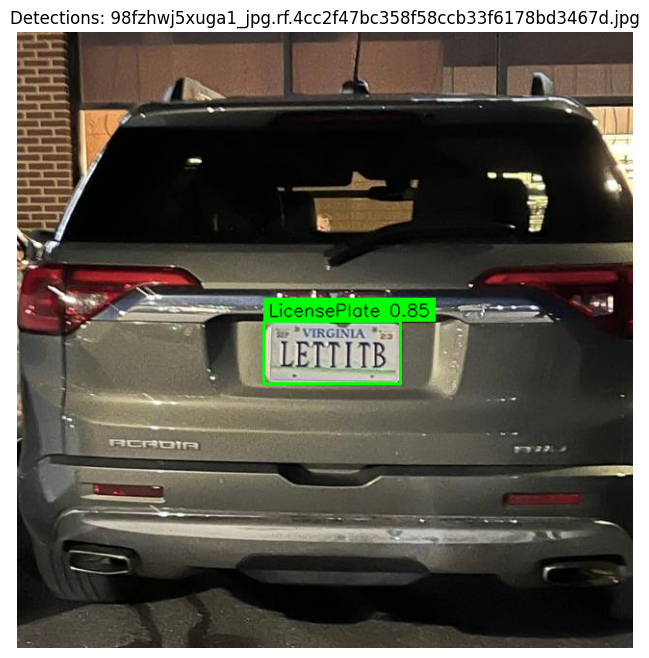

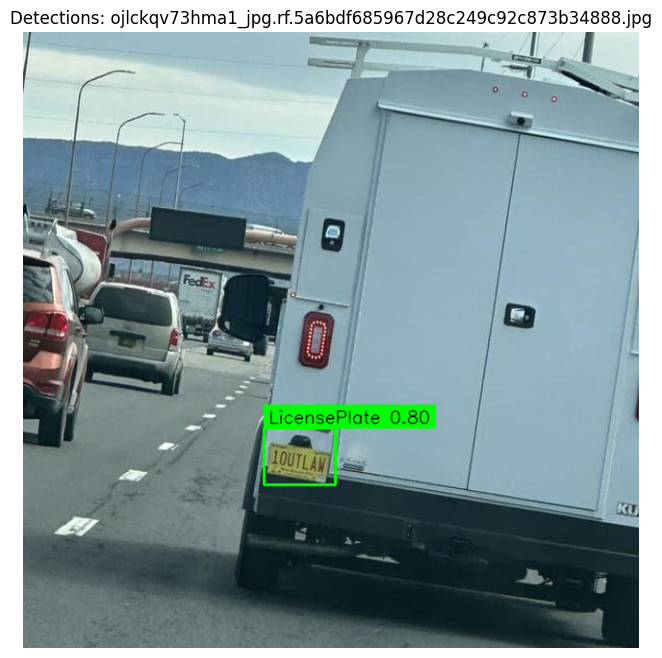

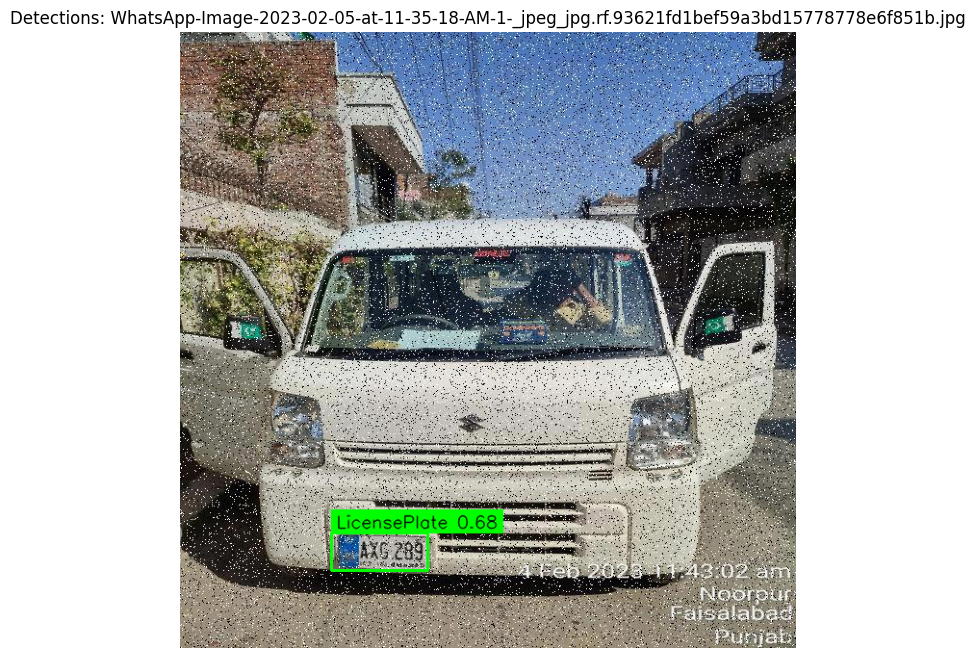

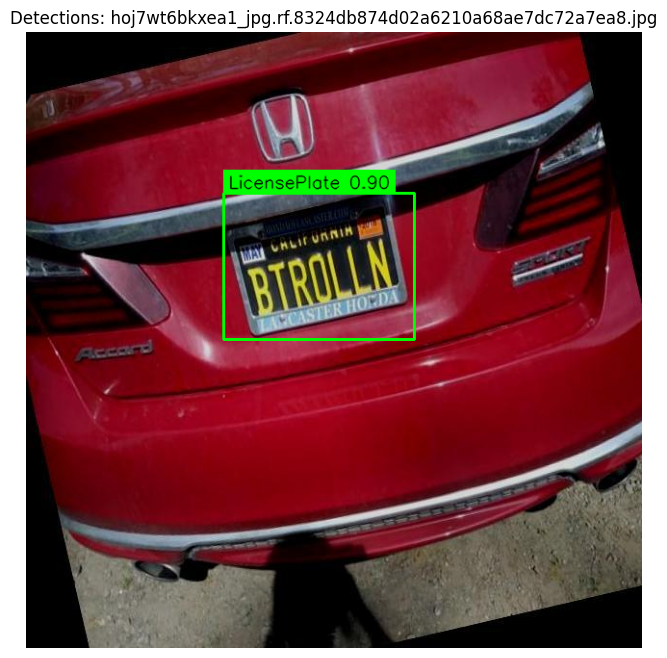

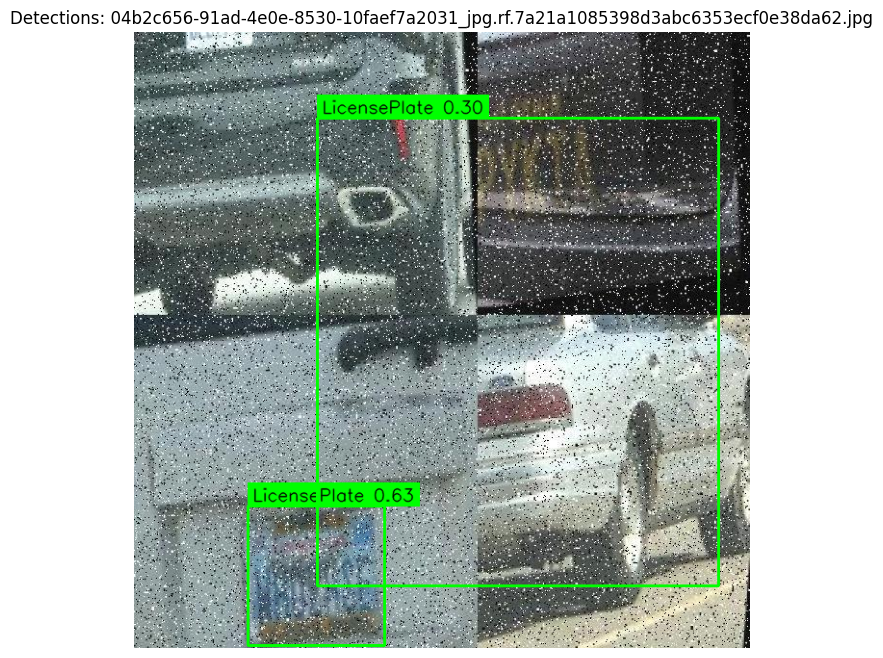

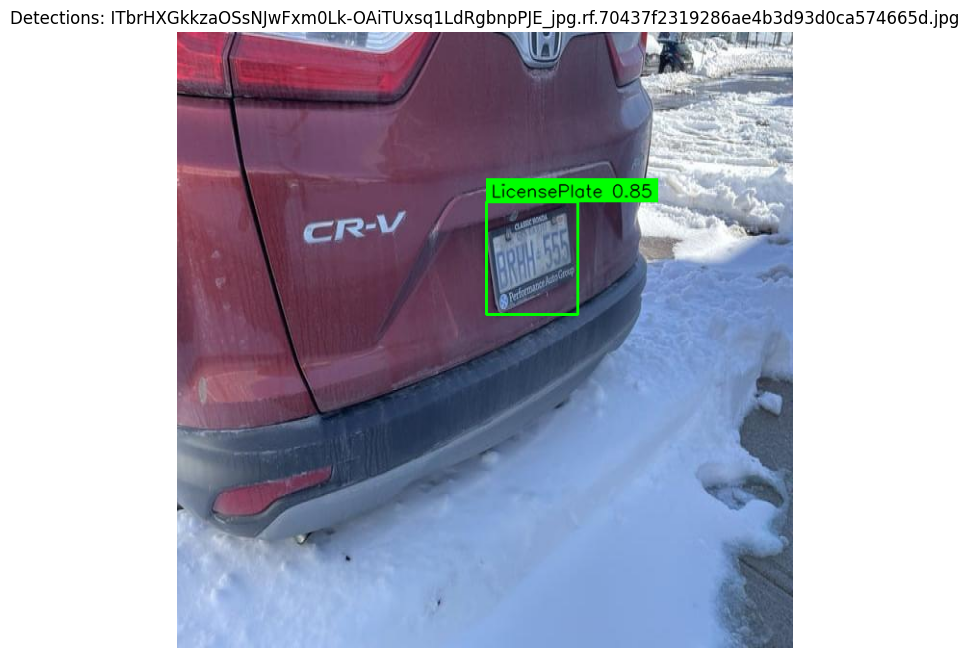

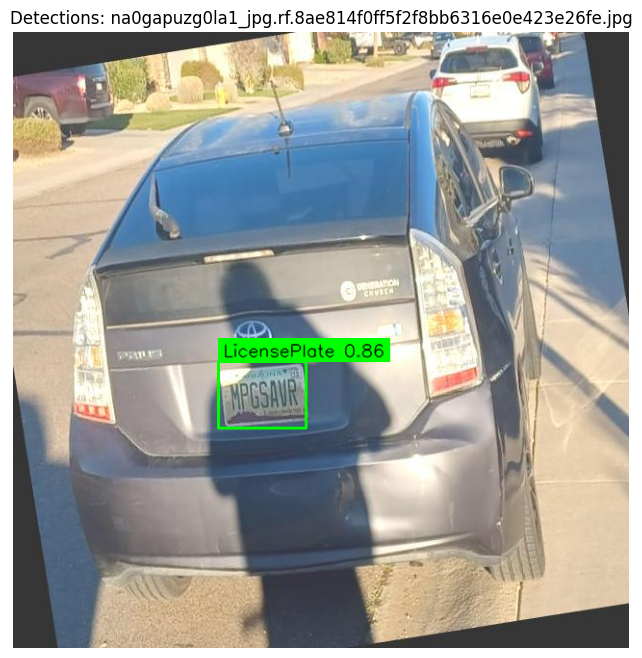

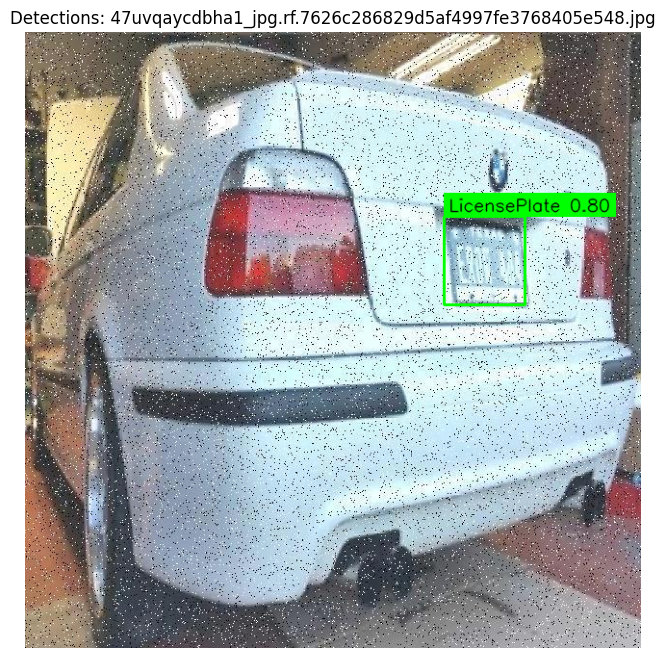

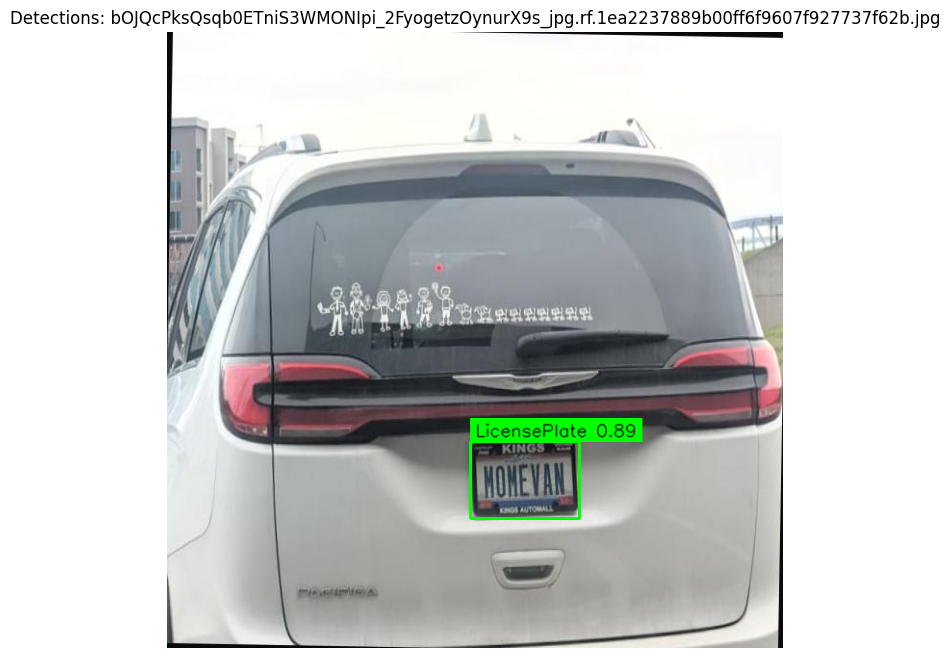

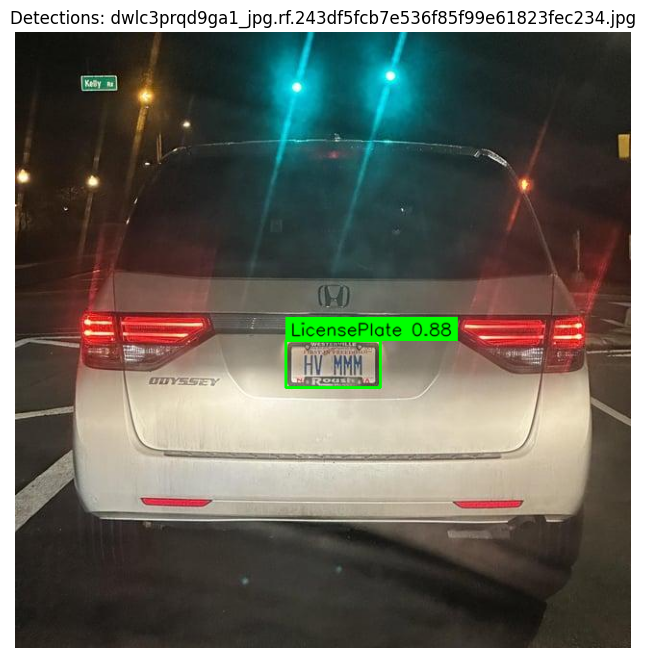

In [16]:
test_images_dir = f"{dataset.location}/test/images"
inference_results = run_inference_and_visualize(
    best_model,
    test_images_dir,
    data_config['names'],
    conf_thresh=0.25,
    save_dir=f"inference_results"
)

In [17]:
def create_detection_heatmap(model, images_dir, output_path=None, conf_thresh=0.25):
    image_paths = glob.glob(f"{images_dir}/*.jpg")
    
    if not image_paths:
        print(f"No images found in {images_dir}")
        return
    
    sample_img = cv2.imread(image_paths[0])
    height, width = sample_img.shape[:2]
    
    heatmap = np.zeros((height, width), dtype=np.float32)
    
    for img_path in tqdm(image_paths, desc="Creating heatmap"):
        img = cv2.imread(img_path)
        
        results = model(img, conf=conf_thresh, verbose=False)[0]
        
        # Get boxes and confidence values directly from results
        boxes = results.boxes.xyxy.cpu().numpy()
        confs = results.boxes.conf.cpu().numpy()
        
        for box, conf in zip(boxes, confs):
            x1, y1, x2, y2 = map(int, box)
            heatmap[y1:y2, x1:x2] += conf
    
    if np.max(heatmap) > 0:
        heatmap = heatmap / np.max(heatmap)
    
    heatmap_color = cv2.applyColorMap((heatmap * 255).astype(np.uint8), cv2.COLORMAP_JET)
    
    background = cv2.imread(image_paths[0])
    
    alpha = 0.7
    overlay = cv2.addWeighted(background, 1 - alpha, heatmap_color, alpha, 0)
    
    plt.figure(figsize=(15, 10))
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.title("Detection Heatmap")
    plt.axis('off')
    
    if output_path:
        plt.savefig(output_path)
    
    plt.show()

Creating heatmap:   0%|          | 0/226 [00:00<?, ?it/s]

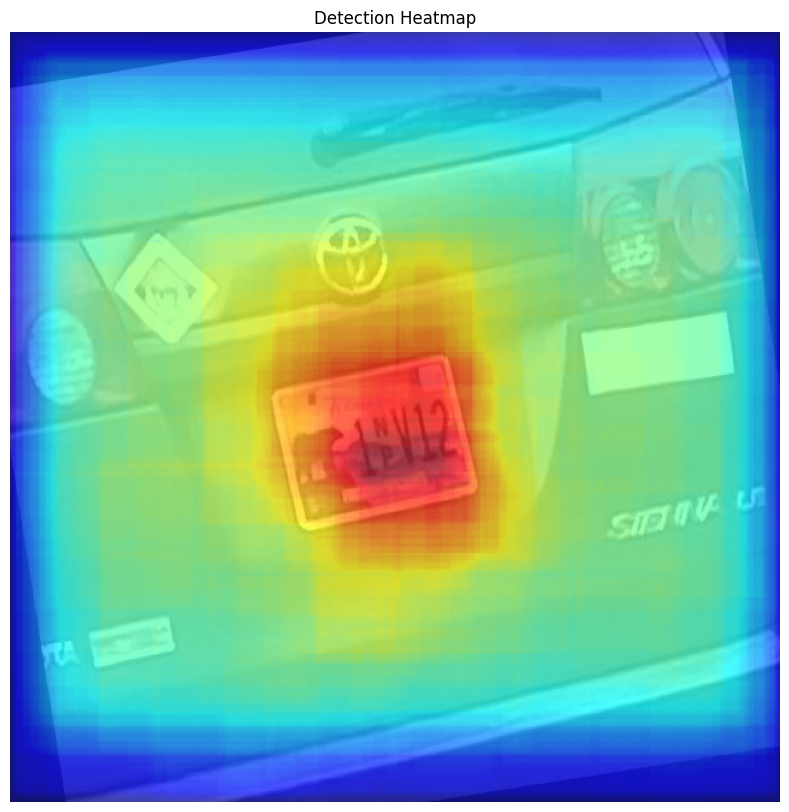

In [18]:
create_detection_heatmap(
    best_model,
    f"{dataset.location}/test/images",
    output_path=f"detection_heatmap.png",
    conf_thresh=0.25
)

In [20]:
!zip output.zip -r /kaggle/working/ 

updating: kaggle/working/ (stored 0%)
updating: kaggle/working/yolo11n.pt (deflated 11%)
updating: kaggle/working/detection_heatmap.png (deflated 2%)
updating: kaggle/working/sample_hongarije30_jpg.rf.7baf4cae580a36ee96131bfea5bf53bb.jpg (deflated 7%)
updating: kaggle/working/class_distribution.png (deflated 25%)
updating: kaggle/working/inference_results/ (stored 0%)
updating: kaggle/working/inference_results/bOJQcPksQsqb0ETniS3WMONIpi_2FyogetzOynurX9s_jpg.rf.1ea2237889b00ff6f9607f927737f62b.jpg_detection.png (deflated 2%)
updating: kaggle/working/inference_results/hoj7wt6bkxea1_jpg.rf.8324db874d02a6210a68ae7dc72a7ea8.jpg_detection.png (deflated 1%)
updating: kaggle/working/inference_results/WhatsApp-Image-2023-02-05-at-11-35-18-AM-1-_jpeg_jpg.rf.93621fd1bef59a3bd15778778e6f851b.jpg_detection.png (deflated 1%)
updating: kaggle/working/inference_results/ITbrHXGkkzaOSsNJwFxm0Lk-OAiTUxsq1LdRgbnpPJE_jpg.rf.70437f2319286ae4b3d93d0ca574665d.jpg_detection.png (deflated 2%)
updating: kaggle/w